<img src='https://github.com/Ikomia-dev/notebooks/blob/main/examples/img/banner_ikomia.png?raw=true'>




# How to run Segment Anything Model 2 (SAM 2) with the Ikomia API 

**SAM 2** (Faster Segment Anything) is an advanced computer vision model developed by Meta AI that extends the capabilities of its predecessor, the original SAM. It is designed to perform real-time, promptable segmentation on both static images and dynamic video content.

The model is capable of generating segmentation masks based on user inputs, such as clicks, bounding boxes, or initial masks, making it highly versatile and user-friendly. SAM 2 is particularly notable for its ability to handle both image and video data within a unified framework, offering enhanced performance and efficiency in a variety of applications


![illustration](https://raw.githubusercontent.com/facebookresearch/segment-anything-2/main/assets/sa_v_dataset.jpg)

## Setup

You need to install Ikomia Python API with pip


In [ ]:
!pip install ikomia

---

**-Google Colab ONLY- Restart runtime**

Click on the "RESTART RUNTIME" button at the end the previous window.

---

## Run SAM 2 on your image

**Compatibility Note: This algorithm requires Python 3.11 or later.**

#### *General parameters*
- `model_name` `[str]` : The SAM model can be loaded with four different encoders:
    - sam2_hiera_tiny - size: 38.9
    - sam2_hiera_small - size: 46
    - sam2_hiera_base_plus - size: 80.8
    - sam2_hiera_large - size: 224.4
- `cuda` `[bool]`: If True, CUDA-based inference (GPU). If False, run on CPU.
- `input_size_percent` `[int]` : Percentage size of the input image. Can be reduce to save memory usage.
- `apply_postprocessing` `[Bool]` : Whether or not to apply mask output image post processing.

In [1]:
from ikomia.dataprocess.workflow import Workflow

from ikomia.utils.displayIO import display

# Display segmentation mask
from PIL import ImageShow
ImageShow.register(ImageShow.IPythonViewer(), 0)


### <u>Automatic mask generator</u>

When no prompt is used, SAM2 will generate masks automatically over the entire image. 

In [ ]:
from ikomia.dataprocess.workflow import Workflow

# Init your workflow
wf = Workflow()

# Add algorithm
algo  = wf.add_task(name="infer_segment_anything_2", auto_connect=True)

# Setting parameters: boxes on the wheels
algo.set_parameters({
    "model_name": "sam2_hiera_small",
    "cuda": "True",
    "points_per_side": "32",
    "input_size_percent": "80",
    "apply_postprocessing": "True"
})

# Run directly on your image
wf.run_on(url="https://raw.githubusercontent.com/facebookresearch/segment-anything-2/main/notebooks/images/cars.jpg")

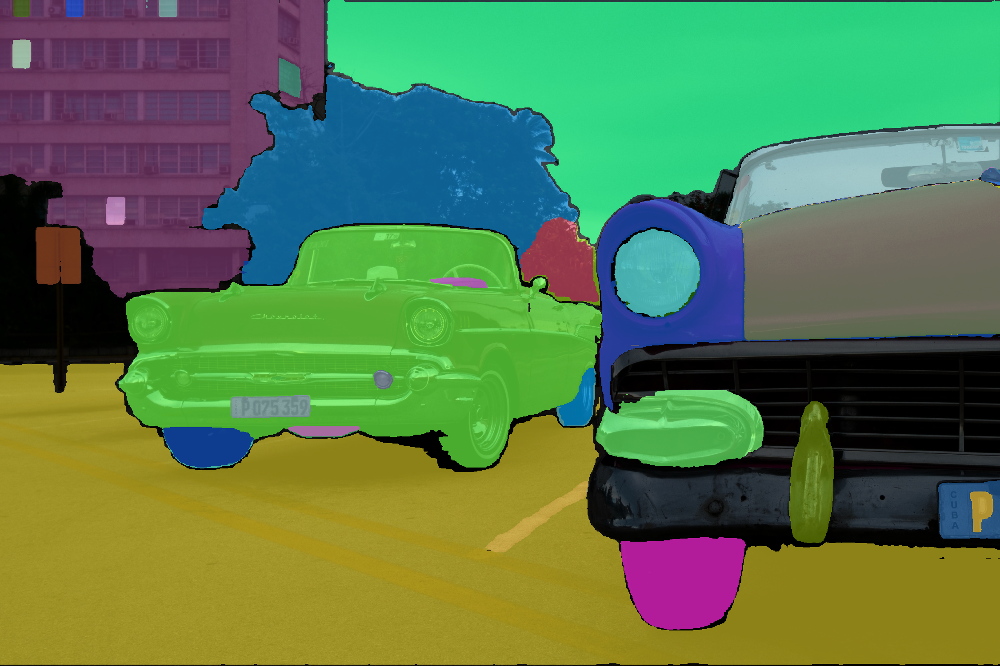

In [3]:
# Display your image
display(algo.get_image_with_mask())


#### *Automatic predictor parameters*
- `points_per_side` `[int or None]` - the number of points to be sampled
along one side of the image. The total number of points is
- `points_per_batch` - `[int]` - sets the number of points run simultaneously
by the model. Higher numbers may be faster but use more GPU memory.
- `iou_thresh` `[float]` - a filtering threshold in `[0,1]`, using the
model's predicted mask quality.
- `stability_score_thresh` - `[float]` - a filtering threshold in `[0,1]`, using
the stability of the mask under changes to the cutoff used to binarize
the model's mask predictions.
- `stability_score_offset` - `[float]` - the amount to shift the cutoff when
calculated the stability score.
- `box_nms_thresh` - `[float]` - the box IoU cutoff used by non-maximal
suppression to filter duplicate masks.
- `crop_n_layers` - `[int]` - if `>0`, mask prediction will be run again on
crops of the image. Sets the number of layers to run, where each
layer has `2`i_layer` number of image crops.
- `crop_nms_thresh` - `[float]` - the box IoU cutoff used by non-maximal
suppression to filter duplicate masks between different crops.
- `crop_overlap_ratio` - `[float]` - sets the degree to which crops overlap.
In the first crop layer, crops will overlap by this fraction of
the image length. Later layers with more crops scale down this overlap.
- `crop_n_points_downscale_factor` - `[int]` - the number of points-per-side
sampled in layer `n` is scaled down by `crop_n_points_downscale_factor`n`.
- `use_m2m` - `[bool]`: Whether to add a one step refinement using previous mask predictions.

### <u>Box prompt</u>

In [ ]:
from ikomia.dataprocess.workflow import Workflow

# Init your workflow
wf = Workflow()

# Add algorithm
algo  = wf.add_task(name="infer_segment_anything_2", auto_connect=True)

# Setting parameters: boxes on the wheels
algo.set_parameters({
    "input_box": "[[425, 600, 700, 875], [1240, 675, 1400, 750], [1375, 550, 1650, 800]]"
})

# Run directly on your image
wf.run_on(url="https://github.com/facebookresearch/segment-anything/blob/main/notebooks/images/truck.jpg?raw=true")


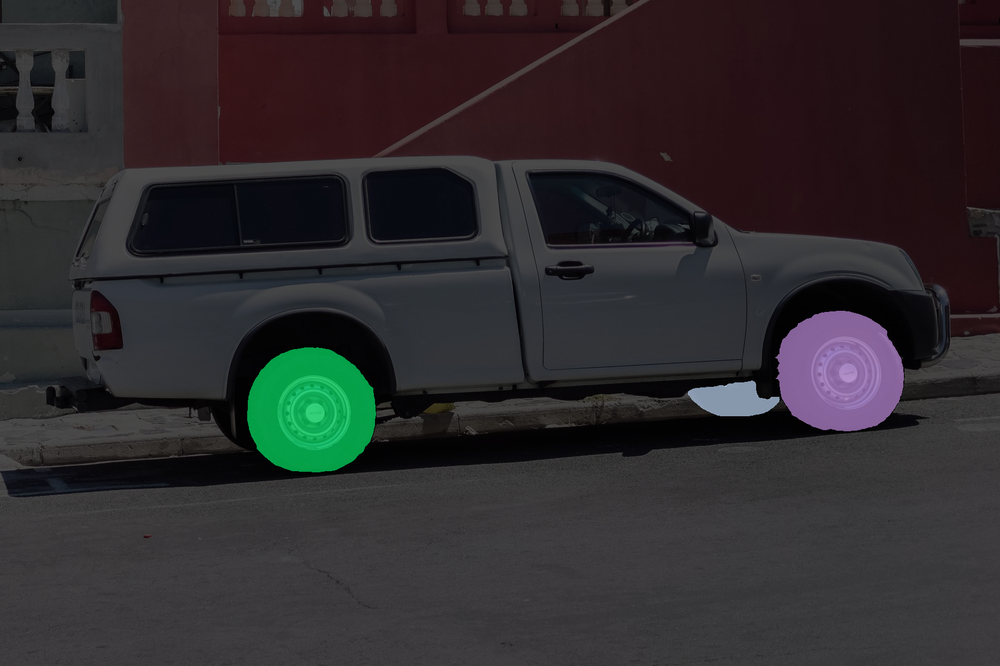

In [5]:
display(algo.get_image_with_mask())

### <u>Point prompt</u>

In [ ]:
# Init your workflow
wf = Workflow()

# Add algorithm
algo  = wf.add_task(name="infer_segment_anything_2", auto_connect=True)

# Setting parameters: boxes on the wheels
algo.set_parameters({
    "input_point": "[[500, 375]]",
    "input_point_label": "[1]",
    "multimask_output": "True"
})

# Run directly on your image
wf.run_on(url="https://github.com/facebookresearch/segment-anything/blob/main/notebooks/images/truck.jpg?raw=true")

# Get outputs
img_output = algo.get_output(0)
# mask_output = algo.get_output(1)
mask_output_2 = algo.get_output(2)
# mask_output_3 = algo.get_output(3)

# Display your image
display(img_output.get_image_with_mask(mask_output_2), title="Mask 2")


### <u>Combined box and point prompt</u>

In [ ]:
# Init your workflow
wf = Workflow()

# Add algorithm
algo  = wf.add_task(name="infer_segment_anything_2", auto_connect=True)

# Setting parameters: boxes on the wheels
algo.set_parameters({
    "model_name": "sam2_hiera_large",
    "input_box": "[[425, 600, 700, 875]]",
    "input_point": "[[575, 750]]",
    "input_point_label": "[0]"
})

# Run directly on your image
wf.run_on(url="https://github.com/facebookresearch/segment-anything/blob/main/notebooks/images/truck.jpg?raw=true")

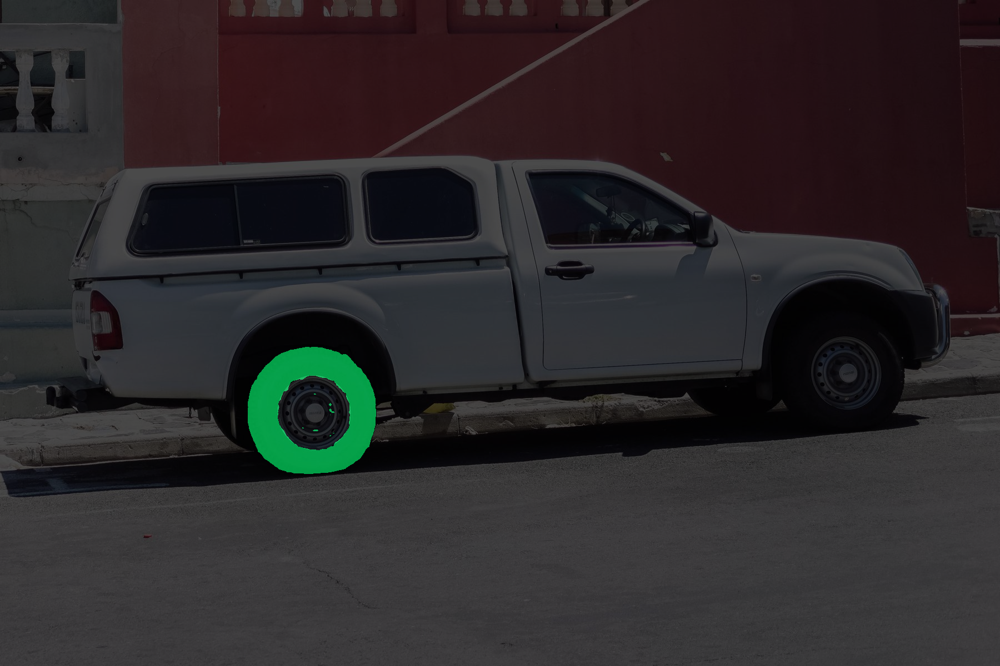

In [7]:
# Display your image
display(algo.get_image_with_mask())

### *Prompt predictor parameters*
- `input_box` `[list]`: A Nx4 array of given box prompts to the  model, in [[XYXY]] or [[XYXY], [XYXY]] format.
- `input_point` `[list]`: A Nx2 array of point prompts to the model. Each point is in [[X,Y]] or [[XY], [XY]] in pixels.
- `input_point_label` `[list]`: A length N array of labels for the point prompts. 1 indicates a foreground point and 0 indicates a background point
- `multimask_output` - `[bool]`: if true, the model will return three masks. If only a single mask is needed, the model's predicted quality score can be used to select the best mask. For non-ambiguous prompts, such as multiple input prompts, multimask_output=False can give better results.